# SEED 2022 - Exploratory Data Analysis

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import gc
import math
import random
import json
from itertools import product
from collections.abc import Iterable

import cv2
import matplotlib.pyplot as plt
import tifffile as tiff
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from tqdm.notebook import tqdm

## Utility functions

In [3]:
def plot_barchart(df, x, y, title, size=None):
    fig = go.Figure()
    fig.add_trace(
        go.Bar(
            x=df[x],
            y=df[y],
        )
    )
    fig.update_layout(
        title_text=title,
        title_x=0.5,
        title_font_size=32,
        autosize=False,
        font=dict(
            family="Times New Roman",
            size=20,
        )
    )
    if size is not None:
        if isinstance(size, Iterable):
            if len(size) == 1:
                size = [size, size]
        elif isinstance(size, int):
            size = [size, size]
        else:
            raise AttributeError(f"Size {size} is invalid")
        fig.update_layout(
            width=size[0],
            height=size[1],
        )
    fig.update_xaxes(title_text=x)
    fig.update_yaxes(title_text=y)
    fig.show()

In [4]:
def plot_images(image_dict, title, rows=3, cols=3, size=None):
    fig, axs = plt.subplots(rows, cols, figsize=size)
    fig.suptitle(title)
    
    titles = list(image_dict.keys())
    images = list(image_dict.values())
    for idx, (row, col) in enumerate(product(range(rows), range(cols))):
        axs[row, col].imshow(images[idx])
        axs[row, col].set_title(titles[idx])
    fig.show()

In [5]:
def plot_image(image, title, size=None):
    fig = plt.figure(figsize=size)
    fig.suptitle(title)
    plt.imshow(image)

In [6]:
def resize_wsi(wsi: np.ndarray, scale: int) -> np.ndarray:
    """Resizes the wsi to the given size.
    Args:
        wsi (np.ndarray): wsi.
        scale (int): Relevant scale factor.
    Returns:
        np.ndarray: Resized wsi.
    """
    dsize = (wsi.shape[1] // scale, wsi.shape[0] // scale)
    wsi = cv2.resize(wsi, dsize=dsize, fx=0, fy=0, interpolation=cv2.INTER_AREA)
    return wsi

In [7]:
def extract_contours(config, class_name, json_file_name):
    json_file = os.path.join(config.data_path, f'{class_name}_json', json_file_name)

    with open(json_file, 'r') as f:
        data = json.load(f)
    contours = list()
    for context in data['contexts']:
        contour = list()
        points = context['points']
        for point in points:
            contour.append([int(point['x']), int(point['y'])])
        contour = np.asarray(contour, dtype=np.int32)
        contours.append(contour)
    return contours

In [8]:
def draw_contours(config, class_name, wsi_name, contours, thickness=200):
    wsi = tiff.imread(os.path.join(config.data_path, class_name, wsi_name))
    
    min_x = math.inf
    min_y = math.inf
    max_x = -math.inf
    max_y = -math.inf
    for cnt in contours:
        for point in cnt:
            x, y = point
            if x < min_x:
                min_x = x
            if y < min_y:
                min_y = y
            if x > max_x:
                max_x = x
            if y > max_y:
                max_y = y
    
    pad_x1 = 0
    pad_x2 = 0
    pad_y1 = 0
    pad_y2 = 0
    if min_x < 0:
        pad_x1 = -min_x
    if wsi.shape[1] < max_x:
        pad_x2 = max_x - wsi.shape[1]
    if min_y < 0:
        pad_y1 = -min_y
    if wsi.shape[0] < max_y:
        pad_y2 = max_y - wsi.shape[0]
    wsi = np.pad(wsi, [[pad_y1, pad_y2], [pad_x1, pad_x2], [0, 0]], constant_values=255)
    
    for cnt in contours:
        wsi = cv2.drawContours(wsi, [cnt], 0,(0, 255, 0), thickness)
    wsi = resize_wsi(wsi, scale=config.visualize_down_sample_rate)
    return wsi

## Basic data exploration

In [9]:
class Config:
    def __init__(self):
        self.data_path = r"/media/npu-x/Seagate Backup Plus Drive/seed_processed_data"
        self.visualize_down_sample_rate = 16

In [10]:
config = Config()

### Class info

In [11]:
classes = [_ for _ in os.listdir(config.data_path) if not _.endswith('json') and os.path.isdir(os.path.join(config.data_path, _)) and _ != 'test']

print(f"Number of classes: {len(classes)}")
print(f"Classes: {classes}")

Number of classes: 5
Classes: ['T0', 'T1', 'T2', 'T3', 'Tis']


### Number of samples

In [12]:
train_sample_list = list()
train_sample_dict = dict()
for cls in classes:
    file_names = os.listdir(os.path.join(config.data_path, cls))
    train_sample_list += [os.path.join(cls, _) for _ in file_names]
    train_sample_dict[cls] = file_names

Total number of training samples: 376
Number of samples of different classes:
  Classes  Num Samples
0      T0          200
1      T1           22
2      T2           28
3      T3           94
4     Tis           32


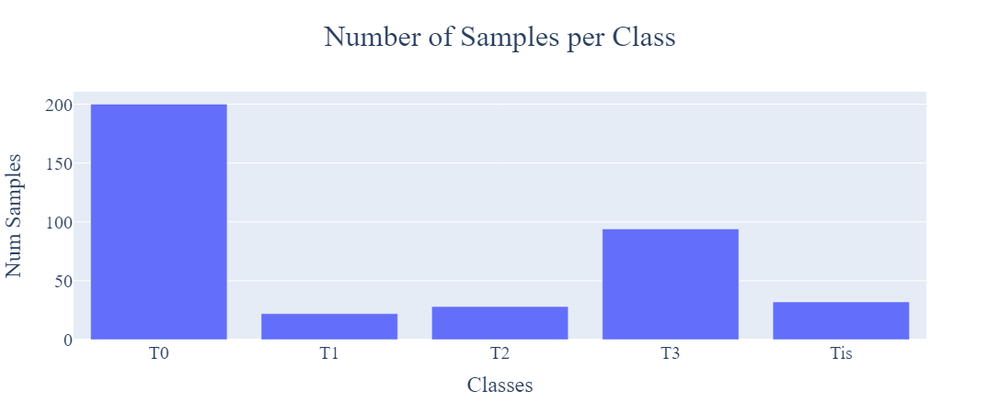

In [13]:
print(f"Total number of training samples: {len(train_sample_list)}")
print("Number of samples of different classes:")
train_sample_df = pd.DataFrame(data={'Classes': train_sample_dict.keys(), 'Num Samples': [len(_) for _ in train_sample_dict.values()]})
print(train_sample_df)
plot_barchart(train_sample_df, 'Classes', 'Num Samples', 'Number of Samples per Class')

### Number of test samples

In [14]:
test_sample_list = os.listdir(os.path.join(config.data_path, 'test'))

train_test_df = pd.DataFrame(data={'Data Split': ['Train', 'Test'], 'Num Samples': [len(train_sample_list), len(test_sample_list)]})

Total number of testing samples: 42


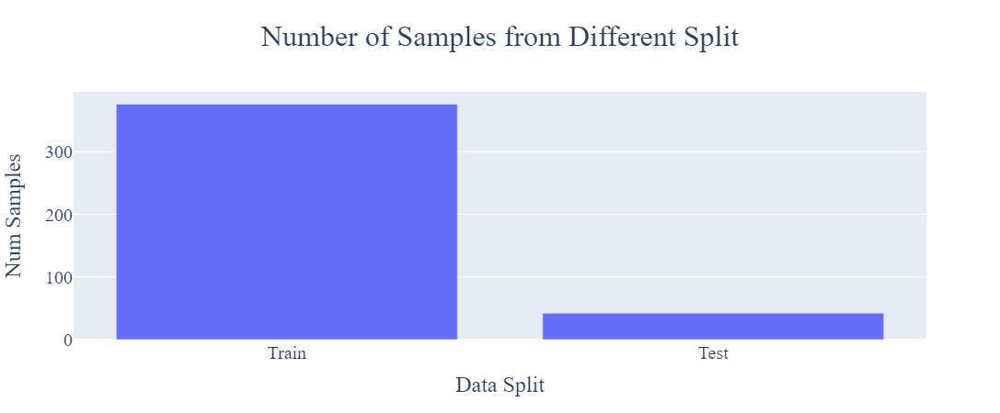

In [15]:
print(f"Total number of testing samples: {len(test_sample_list)}")
plot_barchart(train_test_df, 'Data Split', 'Num Samples', 'Number of Samples from Different Split')

## Sample visualization

### Train

#### T0

  0%|          | 0/9 [00:00<?, ?it/s]

243

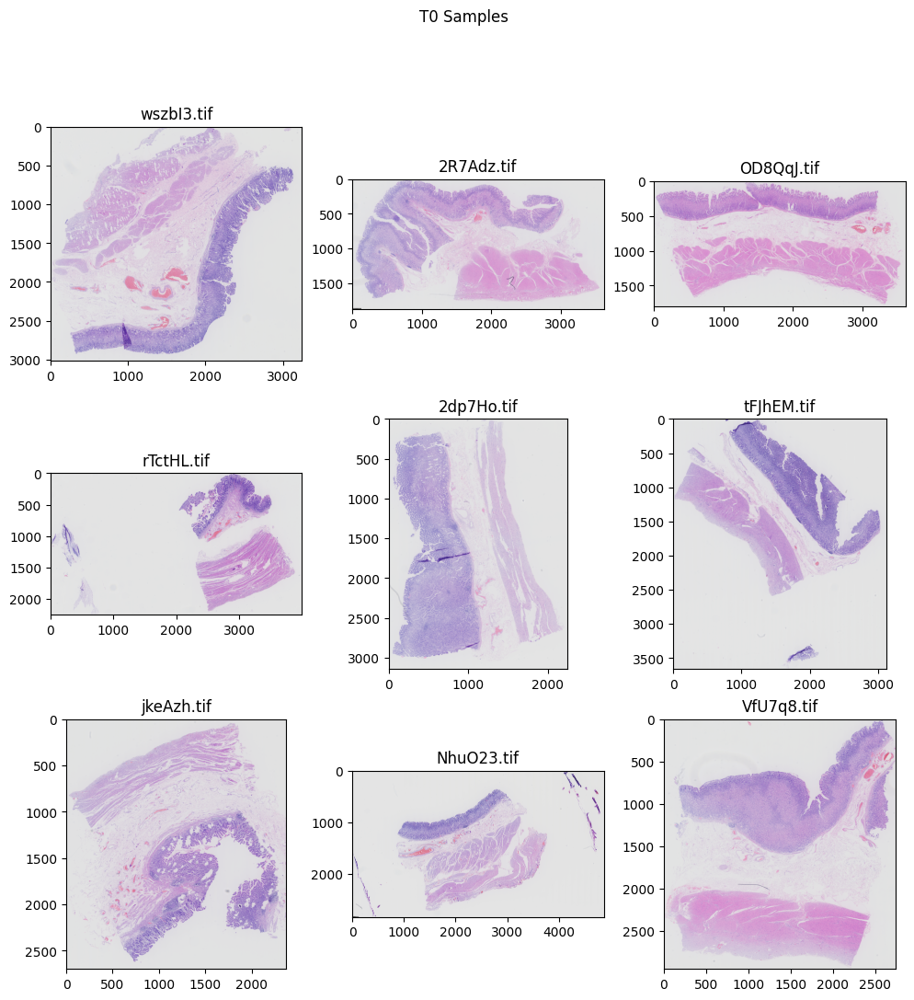

In [16]:
t0_sample_list = random.sample(train_sample_dict['T0'], k=9)
t0_samples = dict()
for sample in tqdm(t0_sample_list):
    wsi = tiff.imread(os.path.join(config.data_path, 'T0', sample))
    wsi = resize_wsi(wsi, scale=config.visualize_down_sample_rate)
    t0_samples[sample] = wsi
plot_images(t0_samples, 'T0 Samples', size=(12, 12))

del t0_samples
gc.collect()

#### T1

  0%|          | 0/9 [00:00<?, ?it/s]

248

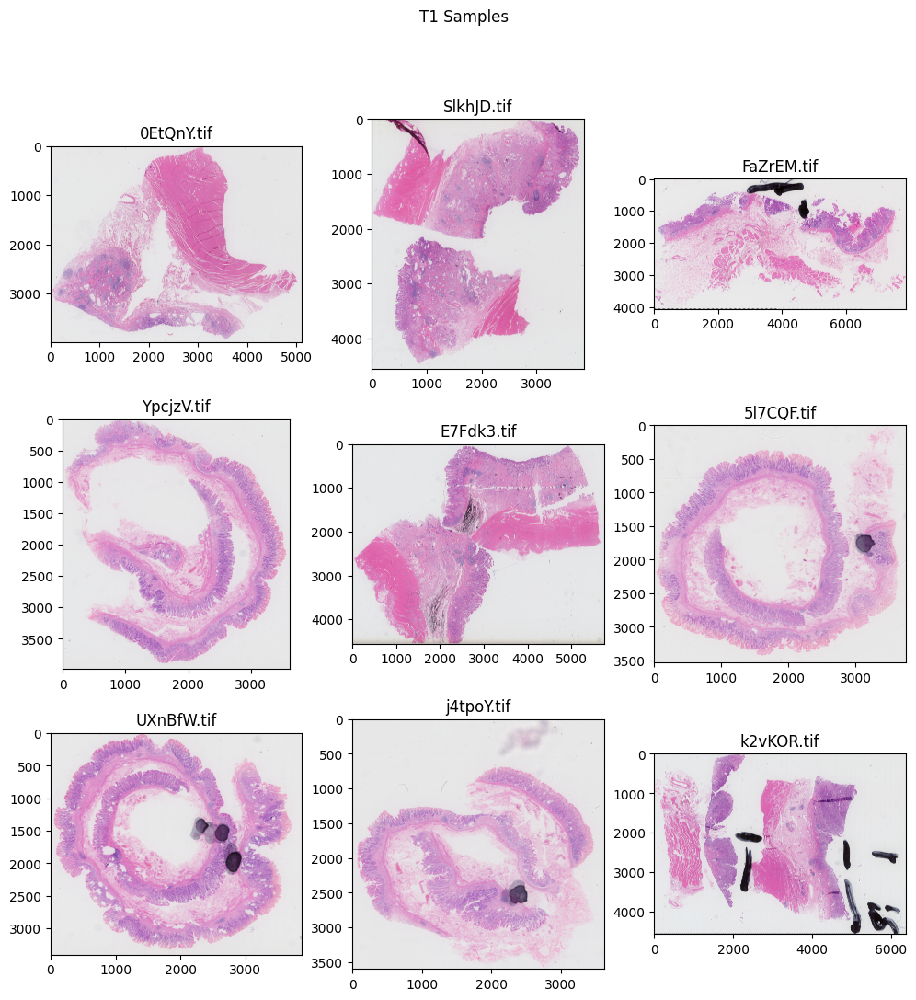

In [17]:
t1_sample_list = random.sample(train_sample_dict['T1'], k=9)
t1_samples = dict()
for sample in tqdm(t1_sample_list):
    wsi = tiff.imread(os.path.join(config.data_path, 'T1', sample))
    wsi = resize_wsi(wsi, scale=config.visualize_down_sample_rate)
    t1_samples[sample] = wsi
plot_images(t1_samples, 'T1 Samples', size=(12, 12))

del t1_samples
gc.collect()

#### T2

  0%|          | 0/9 [00:00<?, ?it/s]

248

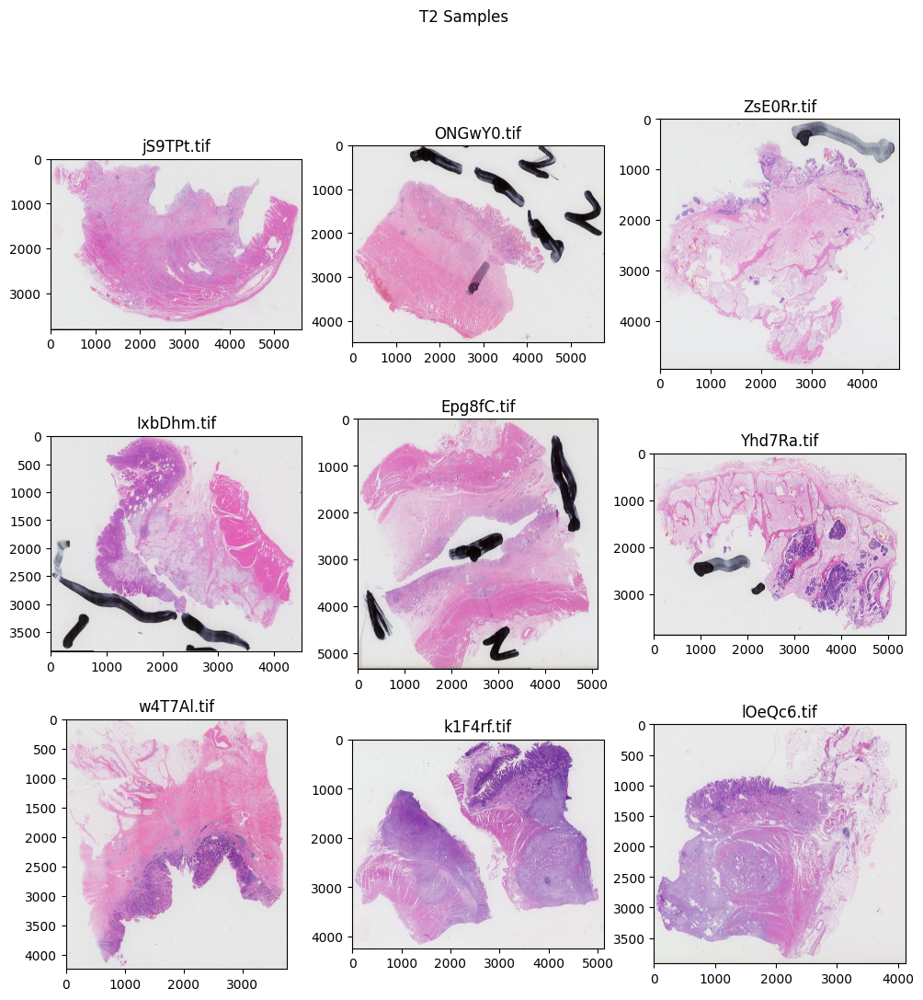

In [18]:
t2_sample_list = random.sample(train_sample_dict['T2'], k=9)
t2_samples = dict()
for sample in tqdm(t2_sample_list):
    wsi = tiff.imread(os.path.join(config.data_path, 'T2', sample))
    wsi = resize_wsi(wsi, scale=config.visualize_down_sample_rate)
    t2_samples[sample] = wsi
plot_images(t2_samples, 'T2 Samples', size=(12, 12))

del t2_samples
gc.collect()

#### T3

  0%|          | 0/9 [00:00<?, ?it/s]

20

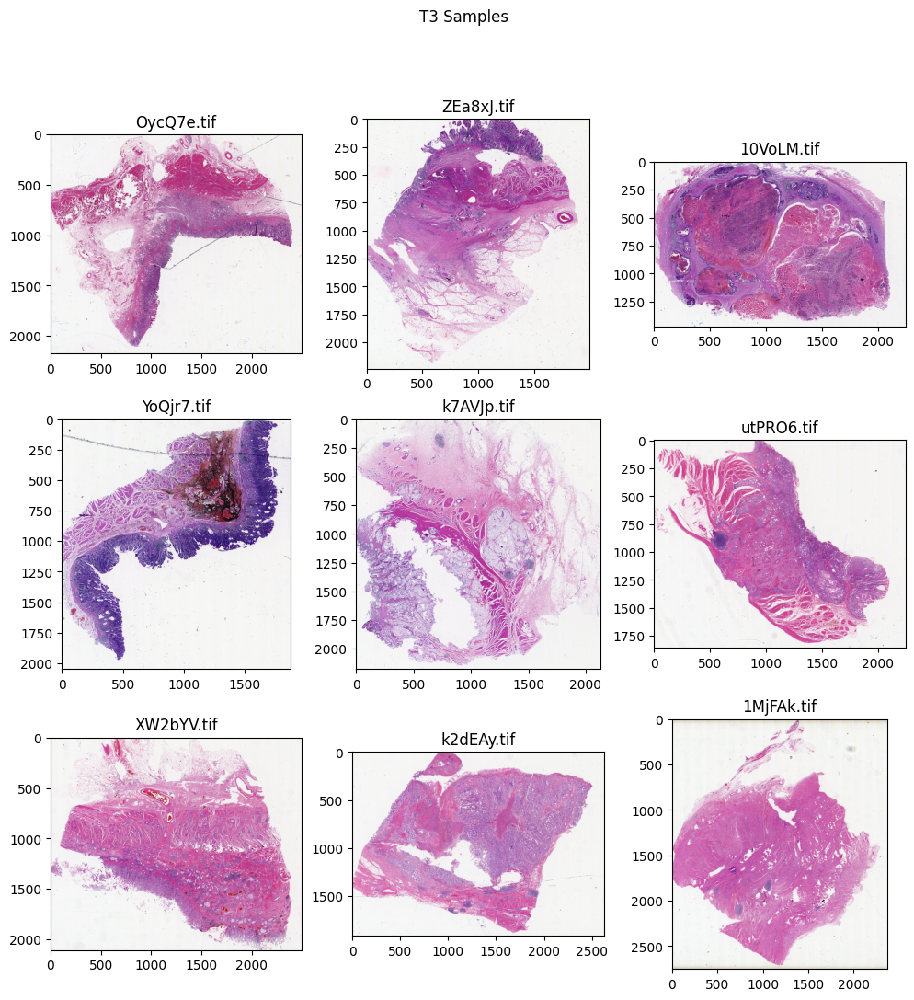

In [19]:
t3_sample_list = random.sample(train_sample_dict['T3'], k=9)
t3_samples = dict()
for sample in tqdm(t3_sample_list):
    wsi = tiff.imread(os.path.join(config.data_path, 'T3', sample))
    wsi = resize_wsi(wsi, scale=config.visualize_down_sample_rate)
    t3_samples[sample] = wsi
plot_images(t3_samples, 'T3 Samples', size=(12, 12))

del t3_samples
gc.collect()

#### Tis

  0%|          | 0/9 [00:00<?, ?it/s]

15

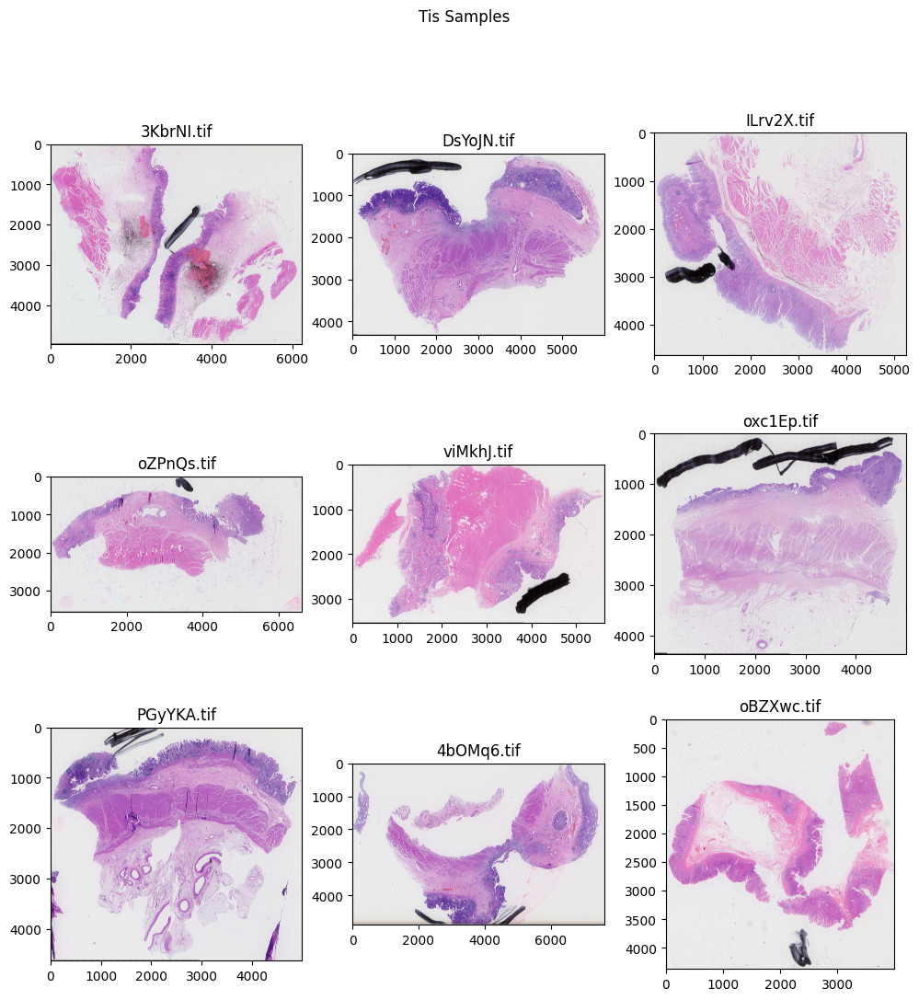

In [20]:
tis_sample_list = random.sample(train_sample_dict['Tis'], k=9)
tis_samples = dict()
for sample in tqdm(tis_sample_list):
    wsi = tiff.imread(os.path.join(config.data_path, 'Tis', sample))
    wsi = resize_wsi(wsi, scale=config.visualize_down_sample_rate)
    tis_samples[sample] = wsi
plot_images(tis_samples, 'Tis Samples', size=(12, 12))

del tis_samples
gc.collect()

### Test

  0%|          | 0/9 [00:00<?, ?it/s]

248

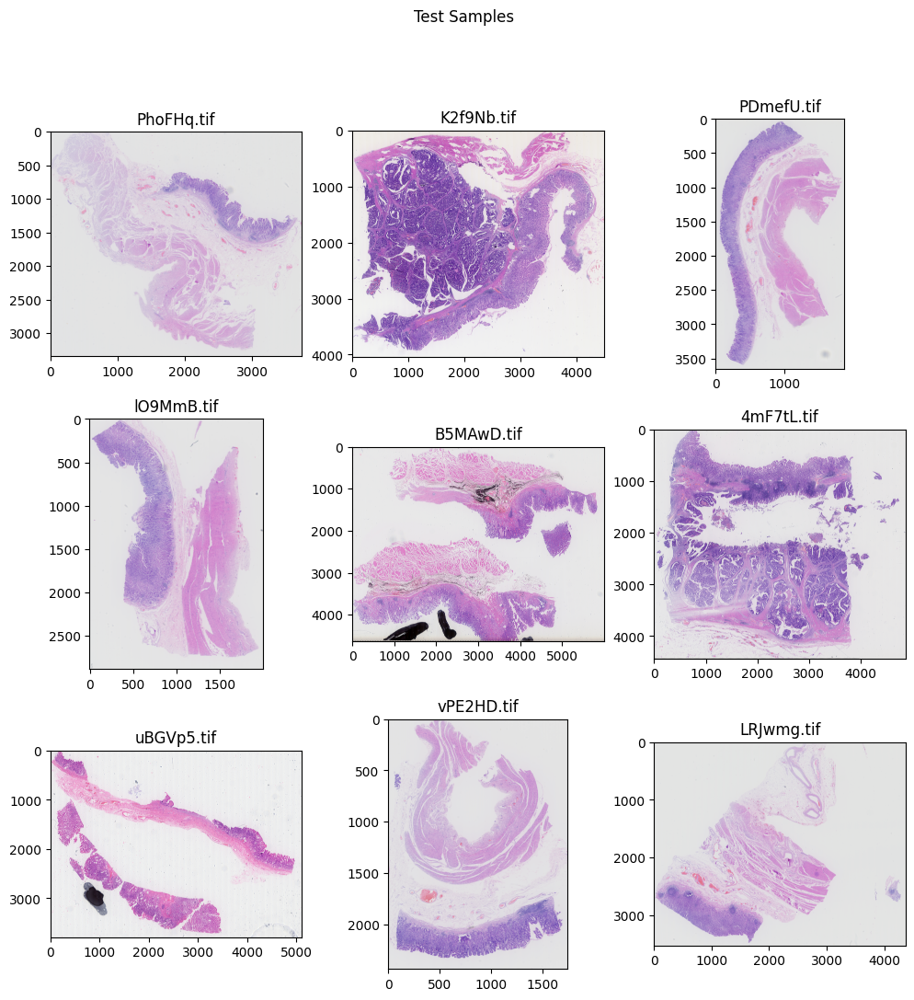

In [21]:
test_sample_list = random.sample(test_sample_list, k=9)
test_samples = dict()
for sample in tqdm(test_sample_list):
    wsi = tiff.imread(os.path.join(config.data_path, 'test', sample))
    wsi = resize_wsi(wsi, scale=config.visualize_down_sample_rate)
    test_samples[sample] = wsi
plot_images(test_samples, 'Test Samples', size=(12, 12))

del test_samples
gc.collect()

## Json annotation

### Train

In [22]:
json_dirs = [_ for _ in os.listdir(config.data_path) if os.path.isdir(os.path.join(config.data_path, _)) and 'test' not in _ and 'json' in _]

train_json_list = list()
train_json_dict = dict()
for json_dir in json_dirs:
    file_names = os.listdir(os.path.join(config.data_path, json_dir))
    train_json_list += [os.path.join(json_dir, _) for _ in file_names]
    train_json_dict[json_dir.split('_')[0]] = file_names

Total number of training jsons: 99
Number of jsons of different classes:
  Classes  Num Jsons
0      T1         17
1      T2         27
2      T3         25
3     Tis         30


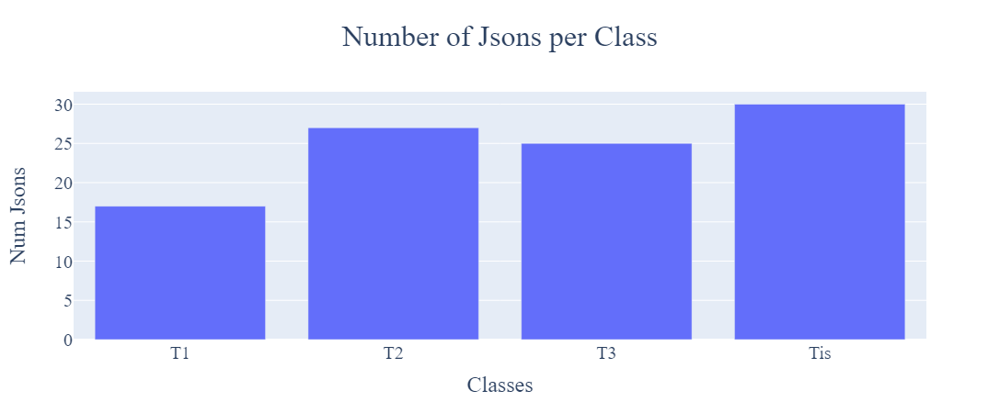

In [23]:
print(f"Total number of training jsons: {len(train_json_list)}")
print("Number of jsons of different classes:")
train_json_df = pd.DataFrame(data={'Classes': train_json_dict.keys(), 'Num Jsons': [len(_) for _ in train_json_dict.values()]})
print(train_json_df)
plot_barchart(train_json_df, 'Classes', 'Num Jsons', 'Number of Jsons per Class')

#### T1

T1 available annotations: 17/22
T1 files having annotations: {'0EtQnY', 'bkZz45', 'FaZrEM', 'zUVJpv', 'sjNL2v', '5ErQmA', 'gQ9GVs', '4RvIGs', 'TNoPDe', 'k2vKOR', 'SlkhJD', 'FIt0oz', 'v3bgUf', 'j4tpoY', 'QHp8qx', 'E7Fdk3', 'ned6fL'}
T1 files missing annotations: {'UXnBfW', 'kMyJmX', '5l7CQF', 'PtarMZ', 'YpcjzV'}



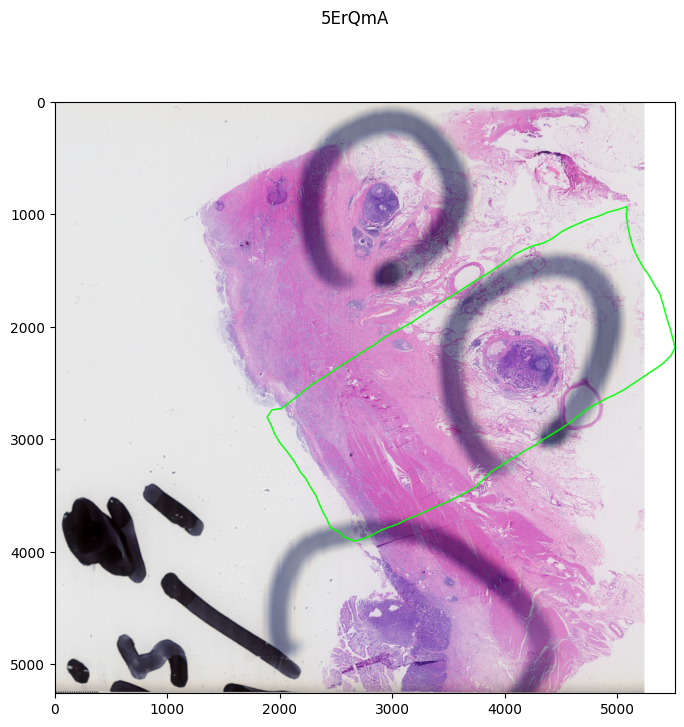

In [24]:
t1_sample_set = set(_.split(".")[0] for _ in train_sample_dict['T1'])
t1_json_set = set(_.split(".")[0] for _ in train_json_dict['T1'])
t1_intersection = t1_sample_set.intersection(t1_json_set)
print(f"T1 available annotations: {len(t1_json_set)}/{len(t1_sample_set)}")
print(f"T1 files having annotations: {t1_intersection}")
print(f"T1 files missing annotations: {t1_sample_set - t1_intersection}\n")

t1_json_sample = random.choice(train_json_dict['T1'])
contours = extract_contours(config, 'T1', t1_json_sample)
wsi = draw_contours(config, 'T1', t1_json_sample.split(".")[0] + '.tif', contours)
plot_image(wsi, t1_json_sample.split(".")[0], size=(8, 8))

#### T2

T2 available annotations: 27/28
T2 files having annotations: {'p6NHOy', 'bCG3TP', 'f83i1F', 'IxbDhm', 'mprY6z', 'ONGwY0', 'jS9TPt', 'mzwqO8', 'aYrFpJ', '7syaIe', '0mLlB3', 'NxCwHc', '7hsLmf', 'ZSVMWI', 'BOq25i', 'vKMWGS', 'Yhd7Ra', 'qH1GYN', 'X9q3Eh', 'g6DxKL', 'jE54pD', 'k1F4rf', 'lOeQc6', 'w4T7Al', 'ZsE0Rr', 'sftB1x', 'Epg8fC'}
T2 files missing annotations: {'Qxerj5'}



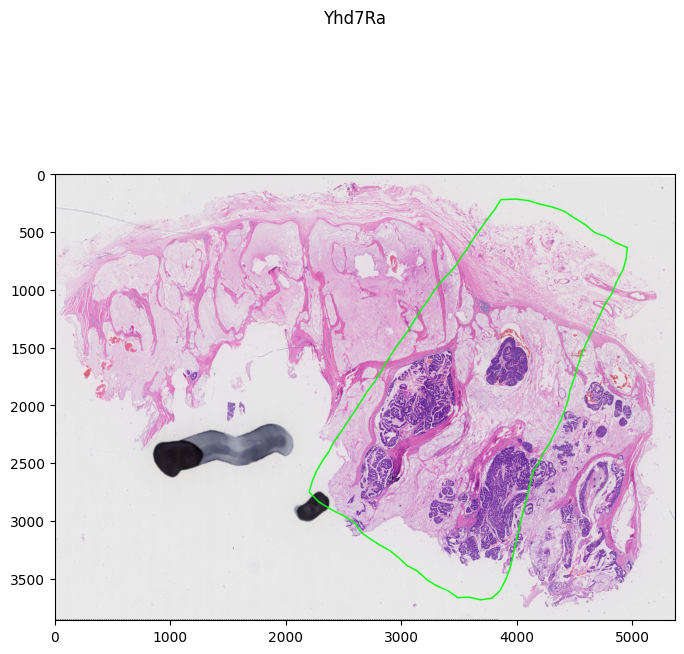

In [25]:
t2_sample_set = set(_.split(".")[0] for _ in train_sample_dict['T2'])
t2_json_set = set(_.split(".")[0] for _ in train_json_dict['T2'])
t2_intersection = t2_sample_set.intersection(t2_json_set)
print(f"T2 available annotations: {len(t2_json_set)}/{len(t2_sample_set)}")
print(f"T2 files having annotations: {t2_intersection}")
print(f"T2 files missing annotations: {t2_sample_set - t2_intersection}\n")

t2_json_sample = random.choice(train_json_dict['T2'])
contours = extract_contours(config, 'T2', t2_json_sample)
wsi = draw_contours(config, 'T2', t2_json_sample.split(".")[0] + '.tif', contours)
plot_image(wsi, t2_json_sample.split(".")[0], size=(8, 8))

#### T3

T3 available annotations: 25/94
T3 files having annotations: {'k7AVJp', 'YbNhWS', '8qeF2g', 'i0x1Yw', 'GKPBox', 'Ct2I6N', 'mfT7JA', 'oA7BpV', 'k2dEAy', 'FovBwE', 'utPRO6', '90G12W', 'ZEa8xJ', 'W2dQEh', 'Au0o8g', 'XW2bYV', 'gocbOa', '4NlObP', 'A9bd2s', 'iLujYN', 'bwpTxS', 'ANnzHR', 'HWVxb2', 'YxRM16', '8Yev5y'}
T3 files missing annotations: {'kvVidF', '3OfuTq', 'TbA0zC', 'KpoI01', 'l4xabD', 'H1jMm0', 'eUMkws', 'FOSftj', 'EUf70n', 'IwxUO6', '10VoLM', 'lg2TvF', 'MWXPCu', 'k3jVIM', 'CYfDIi', 'zKqrJF', 'ROmePs', 'LDCGrQ', 'o9BtWS', 'GKTCej', 'k6TarA', 'ues7dn', 'Bg0kVF', 'EzOt5n', 'fgJUb7', '3NlZKI', 'K4Glmj', 'OI0LrM', '1aUKeE', 'Lm4hW1', 'YoQjr7', 'Q0dtvF', 'BHopux', 'pBUEYg', 'tZEYPI', 'sjoJ2i', '8ZM3Sc', '1MjFAk', 'LWdlIs', 'VqxTsz', 'DdoEyP', 'KmNxo6', 'xXqvPU', 'l6SATC', '0j3PhZ', '8bwO9L', 'eEtpOz', 'RwBrI5', 'hYiy1u', 'OycQ7e', 'oc59YQ', 'cDZRpA', 'hZBAdU', '3nJ2MO', 'btRqkH', '4XISE3', 'R5rNWE', 'dcCxRy', 'EA32KO', 'JY9jGr', '5gCYlL', 'zx9JZB', 'jUf47m', 'dzf2O9', 'FqnXBG', 'YHGP2x

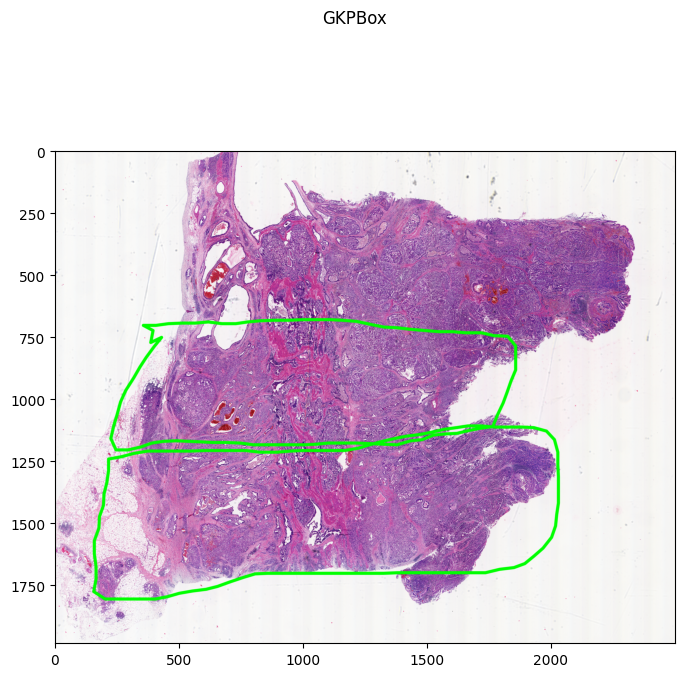

In [26]:
t3_sample_set = set(_.split(".")[0] for _ in train_sample_dict['T3'])
t3_json_set = set(_.split(".")[0] for _ in train_json_dict['T3'])
t3_intersection = t3_sample_set.intersection(t3_json_set)
print(f"T3 available annotations: {len(t3_json_set)}/{len(t3_sample_set)}")
print(f"T3 files having annotations: {t3_intersection}")
print(f"T3 files missing annotations: {t3_sample_set - t3_intersection}\n")

t3_json_sample = random.choice(train_json_dict['T3'])
contours = extract_contours(config, 'T3', t3_json_sample)
wsi = draw_contours(config, 'T3', t3_json_sample.split(".")[0] + '.tif', contours)
plot_image(wsi, t3_json_sample.split(".")[0], size=(8, 8))

#### Tis

Tis available annotations: 30/32
Tis files having annotations: {'I2rQnw', 'cvQ0pB', 'cUM1B6', '3KbrNI', 'iDaZ0k', 'COTaNd', 'fyu95S', 'In8Sq1', 'j1xW68', 'oBZXwc', '4bOMq6', 'OWUqoi', 'XgJ2WQ', 'PGyYKA', 'DsYoJN', 'ILrv2X', 'shXJel', '3mBlV0', 'VUpzLm', 'XMK1pe', 'gqwJQM', '9EmdcO', 'uCFSwz', 'oZPnQs', 'R95Ffo', 'gfmsYU', 'dMuni0', 'oxc1Ep', 'Q1fFSt', 'LJ2oh9'}
Tis files missing annotations: {'va6qdp', 'viMkhJ'}



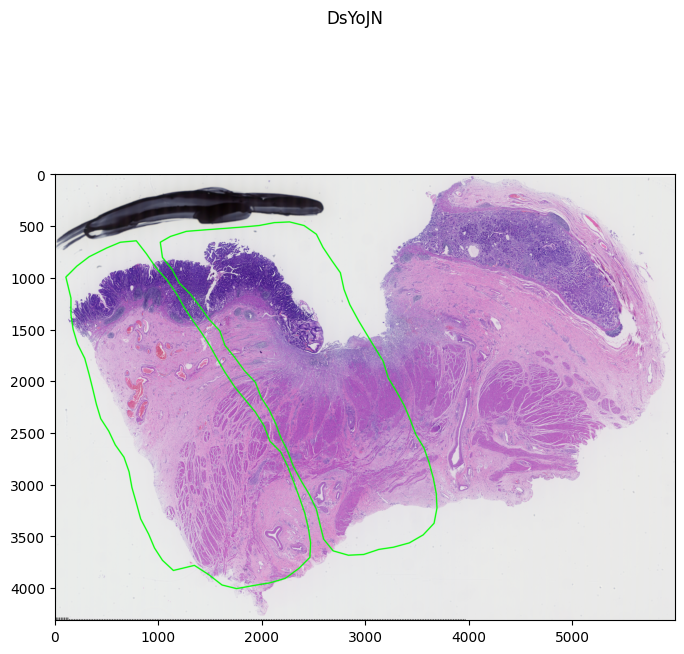

In [27]:
tis_sample_set = set(_.split(".")[0] for _ in train_sample_dict['Tis'])
tis_json_set = set(_.split(".")[0] for _ in train_json_dict['Tis'])
tis_intersection = tis_sample_set.intersection(tis_json_set)
print(f"Tis available annotations: {len(tis_json_set)}/{len(tis_sample_set)}")
print(f"Tis files having annotations: {tis_intersection}")
print(f"Tis files missing annotations: {tis_sample_set - tis_intersection}\n")

tis_json_sample = random.choice(train_json_dict['Tis'])
contours = extract_contours(config, 'Tis', tis_json_sample)
wsi = draw_contours(config, 'Tis', tis_json_sample.split(".")[0] + '.tif', contours)
plot_image(wsi, tis_json_sample.split(".")[0], size=(8, 8))

### Test

In [28]:
test_json_list = os.listdir(os.path.join(config.data_path, 'test_json'))

In [29]:
print(f"Total number of testing jsons: {len(test_json_list)}")

Total number of testing jsons: 42


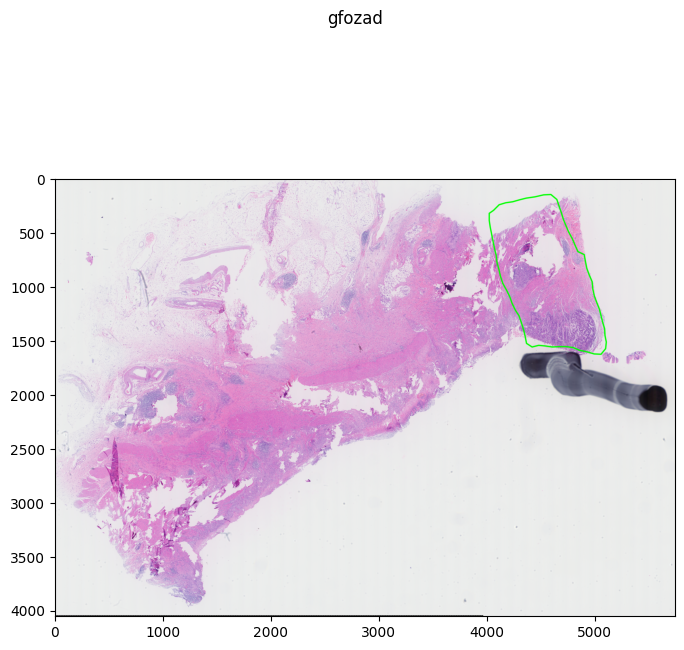

In [30]:
test_json_sample = random.choice(test_json_list)
contours = extract_contours(config, 'test', test_json_sample)
wsi = draw_contours(config, 'test', test_json_sample.split(".")[0] + '.tif', contours)
plot_image(wsi, test_json_sample.split(".")[0], size=(8, 8))